

# Séparation de source audio: Deep Mask interference
## Architecture Deep learning avec Mask Inference

Ce script va permettre de séparer les sources audio d'une musique avec d'un coté la partie vocale et de l'autre la partie instrumentale représentée par la basse, le tombour et le reste.
Nous aurons une partie entraînement du modèle qui utilisera une petite quantité de données de la base de donnée musicale MUSDB18.

In [ ]:
%%capture
!pip install scaper
!pip install nussl
!pip install git+https://github.com/source-separation/tutorial

## Les données et la librairie

Nous allons utiliser `nussl/Tutorial` qui fournit une API de transformation pour l'audio et `torchvision` pour les données images. Nous allons aussi télécharger les 7 premieres secondes de chaque musique dans la base de données MUSDB18 

In [ ]:
import torch
import nussl
from common import viz
import numpy as np
import matplotlib.pyplot as plt

SoX could not be found!

    If you do not have SoX, proceed here:
     - - - http://sox.sourceforge.net/ - - -

    If you do (or think that you should) have SoX, double-check your
    path variables.
    


In [ ]:
# Run this command to download X 7-second clips from MUSDB18
musdb = nussl.datasets.MUSDB18(download=True)

In [ ]:
musdb_train = nussl.datasets.MUSDB18(subsets=['train'])
print(musdb_train.items)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93]


Nous avons 94 pistes audio dans le train .

In [ ]:
idx = 0
item = musdb_train[idx]
item.keys()

dict_keys(['mix', 'sources', 'metadata'])

Chaque élément est un dictionnaire contenant le mix, les sources (stems), les key des stems et les métadonnées. Les métadonnées de cet élément comprennent une liste d'étiquettes:

In [ ]:
from IPython.display import Audio
import IPython

item['metadata']
item['sources'].keys()
Audio(data=item['mix'].audio_data, rate=item['mix'].sample_rate)

Nous allons utiliser le module viz (au lieu de librosa) qui fournit une fonction show_sources pour lire les pistes audio

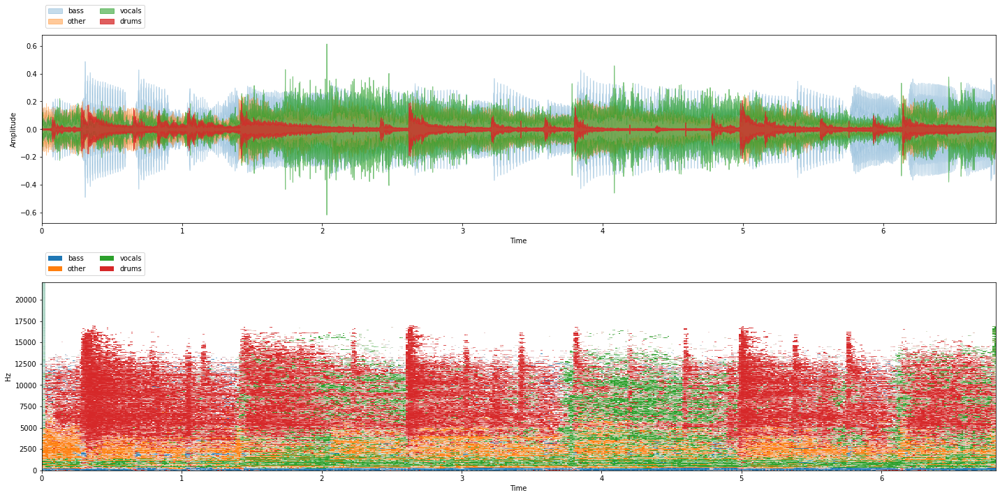


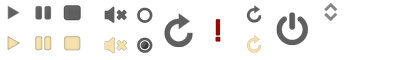
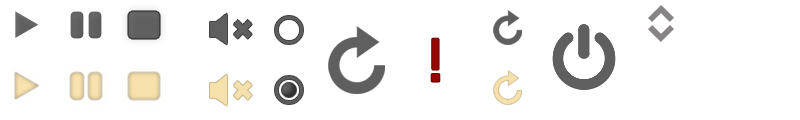
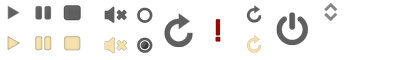

In [ ]:
viz.show_sources(item['sources'])

## Deep audio source separation - the mask

Nous allons voir une visualisation du masque nécessaire pour chaque source afin 
de séparer chaque source avec numpy.

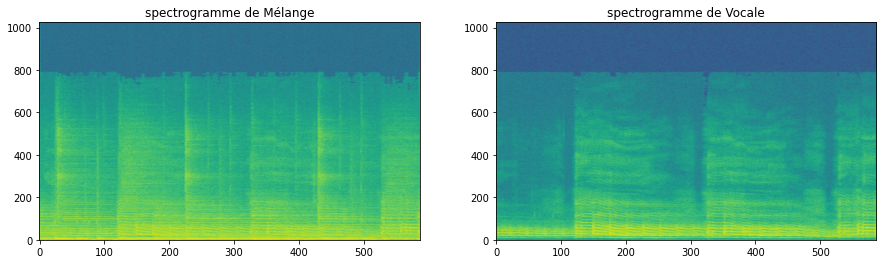

In [ ]:
representation = np.abs(item['mix'].stft())
vocals_representation = np.abs(item['sources']['vocals'].stft())

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('spectrogramme de Mélange')
ax[1].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('spectrogramme de Vocale')
plt.show()

Nous avons la représentation du spectrogramme du mélange et du spectrogramme des voix. Nous ecrivons un Soft mask pour la séparations de voix.

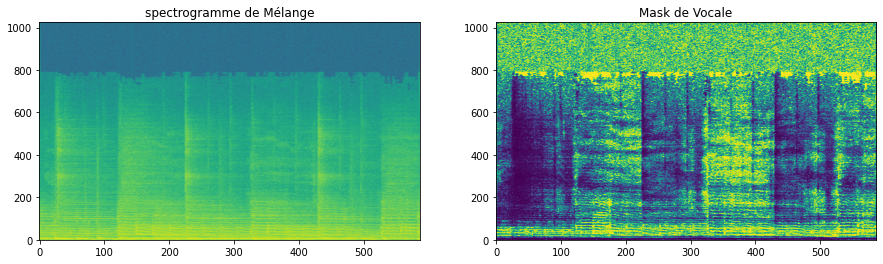

In [ ]:
mask = vocals_representation / (np.maximum(vocals_representation, representation) + 1e-8)

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('spectrogramme de Mélange')
ax[1].imshow(mask[..., 0], origin='lower', aspect='auto')
ax[1].set_title('Mask de Vocale')
plt.show()

Avec le mask, nous allons multiplier le mask par élément avec le spectrogramme de mélange 

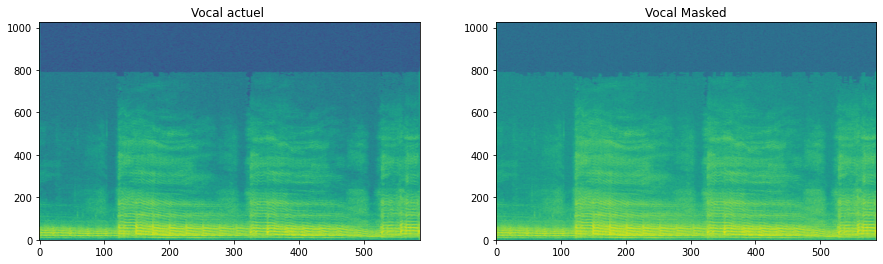

In [ ]:
masked = mask * representation
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Vocal actuel ')
ax[1].imshow(20 * np.log10(masked[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Vocal Masked')
plt.show()

In [ ]:
mix_phase = np.angle(item['mix'].stft())
masked_stft = masked * np.exp(1j * mix_phase)
new_signal = nussl.AudioSignal(stft=masked_stft, sample_rate=item['mix'].sample_rate)
new_signal.istft()
new_signal.embed_audio(display=False)

In [ ]:
mix_tensor = torch.from_numpy(representation)
mask_tensor = torch.rand_like(mix_tensor.unsqueeze(-1))

# shapes
print(mix_tensor.shape, mask_tensor.shape)

# masking operation:
masked_tensor = mix_tensor.unsqueeze(-1) * mask_tensor

print(masked_tensor.shape)

torch.Size([1025, 587, 2]) torch.Size([1025, 587, 2, 1])
torch.Size([1025, 587, 2, 1])


## Construction du model

Nous allons télécharger les 7 premieres secondes de chaque musique dans la base de données MUSDB18 via le tutoriel de la librairie `nussl`

In [ ]:
%%capture
from common import data, viz
import nussl
# Prepare MUSDB
data.prepare_musdb('~/.nussl/tutorial/')



Nous devons définir nos STFTParams et utiliser le tutorial nussl avec OnTheFly



In [ ]:
stft_params = nussl.STFTParams(window_length=512, hop_length=128, window_type='sqrt_hann')
fg_path = "~/.nussl/tutorial/train"
train_data = data.on_the_fly(stft_params, transform=None, fg_path=fg_path, num_mixtures=1000, coherent_prob=1.0)

Nous utilisons un modèle récurrent de mask-inférence

`nussl` possède - `nussl.ml.SeparationModel` avec laquelle tous les modèles doivent s'intégrer. 
Nous allons également donner à notre modèle un nom plus descriptif que `Model` :

In [ ]:
import nussl
import torch
from torch import nn
from torch.nn.utils import weight_norm
from nussl.ml.networks.modules import (
    Embedding, DualPath, DualPathBlock, STFT, 
    LearnedFilterBank, AmplitudeToDB, RecurrentStack,
    MelProjection, BatchNorm, InstanceNorm, ShiftAndScale
)
import numpy as np
from common import utils, argbind
from typing import Dict, List

# ----------------------------------------------------
# --------------------- SEPARATORS -------------------
# ----------------------------------------------------

def dummy_signal():
    return nussl.AudioSignal(
        audio_data_array=np.random.rand(1, 100),
        sample_rate=100
    )

@argbind.bind_to_parser()
def deep_mask_estimation(
    device : torch.device,
    model_path : str = 'checkpoints/best.model.pth',
    mask_type : str = 'soft',
):
    """
    Creates a DeepMaskEstimation Separation object.
    Parameters
    ----------
    device : str
        Either 'cuda' (needs GPU) or 'cpu'.
    model_path : str, optional
        Path to the model, by default 'checkpoints/best.model.pth'
    mask_type : str, optional
        Type of mask to use, either 'soft' or 'binary', by
        default 'soft'.
    """
    separator = nussl.separation.deep.DeepMaskEstimation(
        dummy_signal(), model_path=model_path, device=device, 
        mask_type=mask_type
    )
    return separator

@argbind.bind_to_parser()
def deep_audio_estimation(
    device : torch.device,
    model_path : str = 'checkpoints/best.model.pth',
):
    """
    Creates a DeepMaskEstimation Separation object.
    Parameters
    ----------
    device : str
        Either 'cuda' (needs GPU) or 'cpu'.
    model_path : str, optional
        Path to the model, by default 'checkpoints/best.model.pth'
    mask_type : str, optional
        Type of mask to use, either 'soft' or 'binary', by
        default 'soft'.
    """
    separator = nussl.separation.deep.DeepAudioEstimation(
        dummy_signal(), model_path=model_path, device=device, 
    )
    return separator

# ----------------------------------------------------
# --------------- MASK ESTIMATION MODELS -------------
# ----------------------------------------------------

class MaskInference(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        mix_magnitude = data # save for masking
        
        data = self.amplitude_to_db(mix_magnitude)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        mask = self.embedding(data)
        estimates = mix_magnitude.unsqueeze(-1) * mask
        
        output = {
            'mask': mask,
            'estimates': estimates
        }
        return output
    
    # Added function
    @staticmethod
    @argbind.bind_to_parser()
    def build(num_features, num_audio_channels, hidden_size, 
              num_layers, bidirectional, dropout, num_sources, 
              activation='sigmoid'):
        # Step 1. Register our model with nussl
        nussl.ml.register_module(MaskInference)
        
        # Step 2a: Define the building blocks.
        modules = {
            'model': {
                'class': 'MaskInference',
                'args': {
                    'num_features': num_features,
                    'num_audio_channels': num_audio_channels,
                    'hidden_size': hidden_size,
                    'num_layers': num_layers,
                    'bidirectional': bidirectional,
                    'dropout': dropout,
                    'num_sources': num_sources,
                    'activation': activation
                }
            }
        }
        
        # Step 2b: Define the connections between input and output.
        # Here, the mix_magnitude key is the only input to the model.
        connections = [
            ['model', ['mix_magnitude']]
        ]
        
        # Step 2c. The model outputs a dictionary, which SeparationModel will
        # change the keys to model:mask, model:estimates. The lines below 
        # alias model:mask to just mask, and model:estimates to estimates.
        # This will be important later when we actually deploy our model.
        for key in ['mask', 'estimates']:
            modules[key] = {'class': 'Alias'}
            connections.append([key, [f'model:{key}']])
        
        # Step 2d. There are two outputs from our SeparationModel: estimates and mask.
        # Then put it all together.
        output = ['estimates', 'mask',]
        config = {
            'name': 'MaskInference',
            'modules': modules,
            'connections': connections,
            'output': output
        }
        # Step 3. Instantiate the model as a SeparationModel.
        return nussl.ml.SeparationModel(config)

# ----------------------------------------------------
# --------------- AUDIO ESTIMATION MODELS ------------
# ----------------------------------------------------

class BaseAudioModel(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

    @classmethod
    def config(cls, **kwargs):
        nussl.ml.register_module(cls)
        _config = {
            'modules': {
                'audio': {
                    'class': cls.__name__,
                    'args': kwargs
                }
            },
            'connections': [
                ['audio', ['mix_audio']]
            ],
            'output': ['audio']
        }
        return _config

# ----------------------------------------------------
# ------------- REGISTER MODELS WITH NUSSL -----------
# ----------------------------------------------------

nussl.ml.register_module(MaskInference)

In [ ]:
from nussl.ml.networks.modules import AmplitudeToDB, BatchNorm, RecurrentStack, Embedding
from torch import nn
import torch



nf = stft_params.window_length // 2 + 1
nac = 1
model = MaskInference.build(nf, nac, 50, 2, True, 0.3, 20, ['sigmoid'])



Voici la configuration du modèle 

In [ ]:
print(model.config)

{'name': 'MaskInference', 'modules': {'model': {'class': 'MaskInference', 'args': {'num_features': 257, 'num_audio_channels': 1, 'hidden_size': 50, 'num_layers': 2, 'bidirectional': True, 'dropout': 0.3, 'num_sources': 20, 'activation': ['sigmoid']}, 'module_snapshot': 'No module snapshot could be found. Did you define your class in an interactive Python environment? See https://bugs.python.org/issue12920 for more details.'}, 'mask': {'class': 'Alias', 'module_snapshot': 'class Alias(nn.Module):\n    """\n    Super simple module that just passes the data through without altering it, so\n    that the output of a model can be renamed in a SeparationModel.\n    """\n    def forward(self, data):\n        return data\n', 'args': {}}, 'estimates': {'class': 'Alias', 'module_snapshot': 'class Alias(nn.Module):\n    """\n    Super simple module that just passes the data through without altering it, so\n    that the output of a model can be renamed in a SeparationModel.\n    """\n    def forwar

On imprime le modèle avec les informations sur le nombre de paramètres :

In [ ]:
print(model)

SeparationModel(
  (layers): ModuleDict(
    (model): MaskInference(
      (amplitude_to_db): AmplitudeToDB()
      (input_normalization): BatchNorm(
        (batch_norm): BatchNorm1d(257, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (recurrent_stack): RecurrentStack(
        (rnn): LSTM(257, 50, num_layers=2, batch_first=True, dropout=0.3, bidirectional=True)
      )
      (embedding): Embedding(
        (linear): Linear(in_features=100, out_features=5140, bias=True)
      )
    )
    (mask): Alias()
    (estimates): Alias()
  )
)
Number of parameters: 704054


Voici les modules et les arguments du model

In [ ]:
model.config['modules']['model']['args']

{'activation': ['sigmoid'],
 'bidirectional': True,
 'dropout': 0.3,
 'hidden_size': 50,
 'num_audio_channels': 1,
 'num_features': 257,
 'num_layers': 2,
 'num_sources': 20}

Voici les snapshots

In [ ]:
# import MaskInference

nf = stft_params.window_length // 2 + 1
nac = 1
model = MaskInference.build(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')

In [ ]:
print(model.config['modules']['model']['module_snapshot'])

No module snapshot could be found. Did you define your class in an interactive Python environment? See https://bugs.python.org/issue12920 for more details.


Nous avons les estimations et nous avons un masque.

Maintenant, nous allons entraîner le modèle 

## Training

Nous allons entrainer notre algorithme avec les paramètres proposés par le tutoriel nussl.

In [ ]:
import torch

nf = stft_params.window_length // 2 + 1
nac = 1
model = MaskInference.build(nf, nac, 50, 1, True, 0.0, 1, 'sigmoid')
print(model)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nussl.ml.train.loss.L1Loss()

def train_step(batch):
    optimizer.zero_grad()
    output = model(batch) # forward pass
    loss = loss_fn(
        output['estimates'],
        batch['source_magnitudes']
    )
    
    loss.backward() # backwards + gradient step
    optimizer.step()
    
    return loss.item() # return the loss for bookkeeping.

SeparationModel(
  (layers): ModuleDict(
    (model): MaskInference(
      (amplitude_to_db): AmplitudeToDB()
      (input_normalization): BatchNorm(
        (batch_norm): BatchNorm1d(257, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (recurrent_stack): RecurrentStack(
        (rnn): LSTM(257, 50, batch_first=True, bidirectional=True)
      )
      (embedding): Embedding(
        (linear): Linear(in_features=100, out_features=257, bias=True)
      )
    )
    (mask): Alias()
    (estimates): Alias()
  )
)
Number of parameters: 150071


Dans notre modèle, nous allons appeler une fonction `train_step` et nous aurons également besoin d'une étape de validation `val_step`

Maintenant, nous allons construire notre script d'entraînement complet, en utilisant nussl. on va utilser 40 epochs pour notre entrainement

In [ ]:
import nussl
import torch
from nussl.datasets import transforms as nussl_tfm
#from common.models import MaskInference
from common import utils, data
from pathlib import Path

utils.logger()
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
MAX_MIXTURES = int(1e8) # We'll set this to some impossibly high number for on the fly mixing.

stft_params = nussl.STFTParams(window_length=512, hop_length=128)

tfm = nussl_tfm.Compose([
    nussl_tfm.SumSources([['bass', 'drums', 'other']]),
    nussl_tfm.MagnitudeSpectrumApproximation(),
    nussl_tfm.IndexSources('source_magnitudes', 1),
    nussl_tfm.ToSeparationModel(),
])

train_folder = "~/.nussl/tutorial/train"
val_folder = "~/.nussl/tutorial/valid"

train_data = data.on_the_fly(stft_params, transform=tfm, 
    fg_path=train_folder, num_mixtures=MAX_MIXTURES, coherent_prob=1.0)
train_dataloader = torch.utils.data.DataLoader(
    train_data, num_workers=1, batch_size=10)

val_data = data.on_the_fly(stft_params, transform=tfm, 
    fg_path=val_folder, num_mixtures=10, coherent_prob=1.0)
val_dataloader = torch.utils.data.DataLoader(
    val_data, num_workers=1, batch_size=10)

nf = stft_params.window_length // 2 + 1
model = MaskInference.build(nf, 1, 50, 1, True, 0.0, 1, 'sigmoid')
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nussl.ml.train.loss.L1Loss()

def train_step(engine, batch):
    optimizer.zero_grad()
    output = model(batch) # forward pass
    loss = loss_fn(
        output['estimates'],
        batch['source_magnitudes']
    )
    
    loss.backward() # backwards + gradient step
    optimizer.step()
    
    loss_vals = {
        'L1Loss': loss.item(),
        'loss': loss.item()
    }
    
    return loss_vals

def val_step(engine, batch):
    with torch.no_grad():
        output = model(batch) # forward pass
    loss = loss_fn(
        output['estimates'],
        batch['source_magnitudes']
    )    
    loss_vals = {
        'L1Loss': loss.item(), 
        'loss': loss.item()
    }
    return loss_vals

# Create the engines
trainer, validator = nussl.ml.train.create_train_and_validation_engines(
    train_step, val_step, device=DEVICE
)

# We'll save the output relative to this notebook.
output_folder = Path('.').absolute()

# Adding handlers from nussl that print out details about model training
# run the validation step, and save the models.
nussl.ml.train.add_stdout_handler(trainer, validator)
nussl.ml.train.add_validate_and_checkpoint(output_folder, model, 
    optimizer, train_data, trainer, val_dataloader, validator)

trainer.run(
    train_dataloader, 
    epoch_length=10, 
    max_epochs=40
)

State:
	iteration: 400
	epoch: 40
	epoch_length: 10
	max_epochs: 40
	output: <class 'dict'>
	batch: <class 'dict'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>
	epoch_history: <class 'dict'>
	iter_history: <class 'dict'>
	past_iter_history: <class 'dict'>
	saved_model_path: /content/checkpoints/latest.model.pth
	output_folder: <class 'pathlib.PosixPath'>

Scaper crée des mélanges à la volée pour l'entraînement et la validation du modèle.

## Deploiement

Enfin, nous allons voir comment le modèle peut être chargé dans un objet de séparation *nussl* pour qu'on puisse ecouter avec la séparation.
La façon de le faire est d'utiliser la classe DeepMaskEstimation de *nussl* :

In [ ]:
import torch
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
separator = nussl.separation.deep.DeepMaskEstimation(
    nussl.AudioSignal(), model_path='checkpoints/best.model.pth',
    device=DEVICE,
)

/usr/local/lib/python3.7/dist-packages/nussl/separation/base/separation_base.py:73: UserWarning: input_audio_signal has no data!
  warnings.warn('input_audio_signal has no data!')
/usr/local/lib/python3.7/dist-packages/nussl/core/audio_signal.py:455: UserWarning: Initializing STFT with data that is non-complex. This might lead to weird results!
  warnings.warn('Initializing STFT with data that is non-complex. '


Nous allons tester la séparation de source avec le spectrogramme/sonogramme

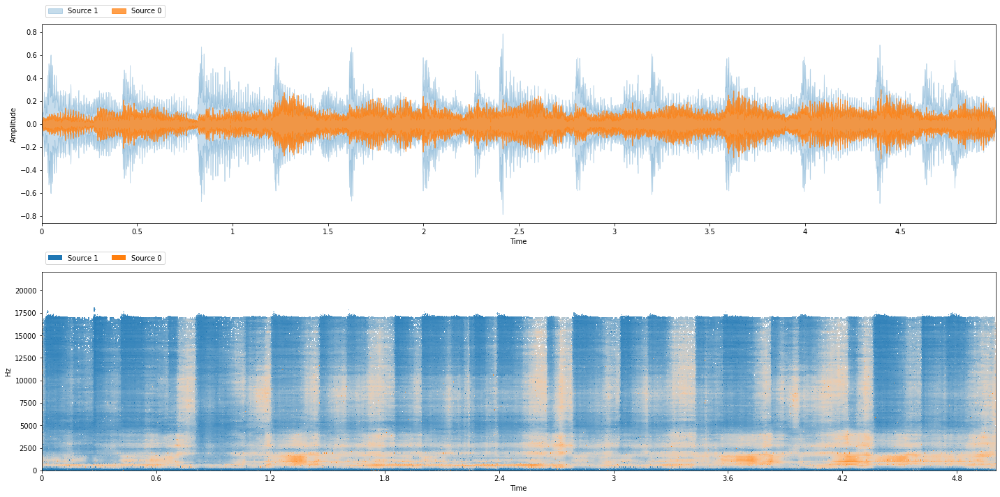


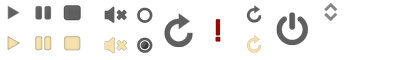
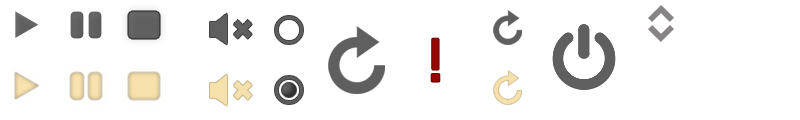
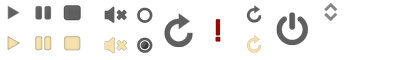

In [ ]:
from common import viz

test_folder = "~/.nussl/tutorial/test/"
test_data = data.mixer(stft_params, transform=None, 
    fg_path=test_folder, num_mixtures=MAX_MIXTURES, coherent_prob=1.0)
item = test_data[40]

separator.audio_signal = item['mix']
estimates = separator()
# Since our model only returns one source, let's tack on the
# residual (which should be accompaniment)
estimates.append(item['mix'] - estimates[0])

viz.show_sources(estimates)

Notre modèle a appris les bandes de fréquences où les choses peuvent être séparées

Nous avons notre algorithme entrainé et nous pouvons maintenant l'evaluer avec notre de jeu de test

## Evaluation Test

 Nous allons évaluer le modèle sur un jeux de données test. Nous allons évaluer le modèle sur la base de donnée MUSDB18 (en utilisant des clips de 7 secondes). Dans un souci d'exécution rapide.

In [ ]:
import json

tfm = nussl_tfm.Compose([
    nussl_tfm.SumSources([['bass', 'drums', 'other']]),
])
test_dataset = nussl.datasets.MUSDB18(subsets=['test'], transform=tfm)

# Just do 5 items for speed. Change to 50 for actual experiment.
for i in range(5):
    item = test_dataset[i]
    separator.audio_signal = item['mix']
    estimates = separator()

    source_keys = list(item['sources'].keys())
    estimates = {
        'vocals': estimates[0],
        'bass+drums+other': item['mix'] - estimates[0]
    }

    sources = [item['sources'][k] for k in source_keys]
    estimates = [estimates[k] for k in source_keys]

    evaluator = nussl.evaluation.BSSEvalScale(
        sources, estimates, source_labels=source_keys
    )
    scores = evaluator.evaluate()
    output_folder = Path(output_folder).absolute()
    output_folder.mkdir(exist_ok=True)
    output_file = output_folder / sources[0].file_name.replace('wav', 'json')
    with open(output_file, 'w') as f:
        json.dump(scores, f, indent=4)

Les mesures sont enregistrées dans des fichiers JSON dont le nom est le même que le nom de l'élément.Nous pouvons agréger toutes les métriques en une seule fiche de rapport en utilisant *nussl* :

In [ ]:
import glob
import numpy as np

json_files = glob.glob(f"*.json")
df = nussl.evaluation.aggregate_score_files(
    json_files, aggregator=np.nanmedian)
nussl.evaluation.associate_metrics(separator.model, df, test_dataset)
report_card = nussl.evaluation.report_card(
    df, report_each_source=True)
print(report_card)

                                                                      
                        MEAN +/- STD OF METRICS                         
                                                                      
┌────────────┬──────────────────┬──────────────────┬──────────────────┐
│ METRIC     │     OVERALL      │ BASS+DRUMS+OTHER │      VOCALS      │
╞════════════╪══════════════════╪══════════════════╪══════════════════╡
│ #          │        10        │        5         │        5         │
├────────────┼──────────────────┼──────────────────┼──────────────────┤
│ SI-SDR     │   4.51 +/-  3.97 │   7.35 +/-  2.58 │   1.67 +/-  2.94 │
├────────────┼──────────────────┼──────────────────┼──────────────────┤
│ SI-SIR     │   8.79 +/-  3.20 │   9.96 +/-  2.59 │   7.62 +/-  3.60 │
├────────────┼──────────────────┼──────────────────┼──────────────────┤
│ SI-SAR     │   7.06 +/-  4.99 │  11.01 +/-  2.95 │   3.12 +/-  2.92 │
├────────────┼──────────────────┼──────────────────┼─────────────